<a href="https://colab.research.google.com/github/nurmuhimawann/otsu-tresholding/blob/main/image_cropping_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# library needed
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
%matplotlib inline

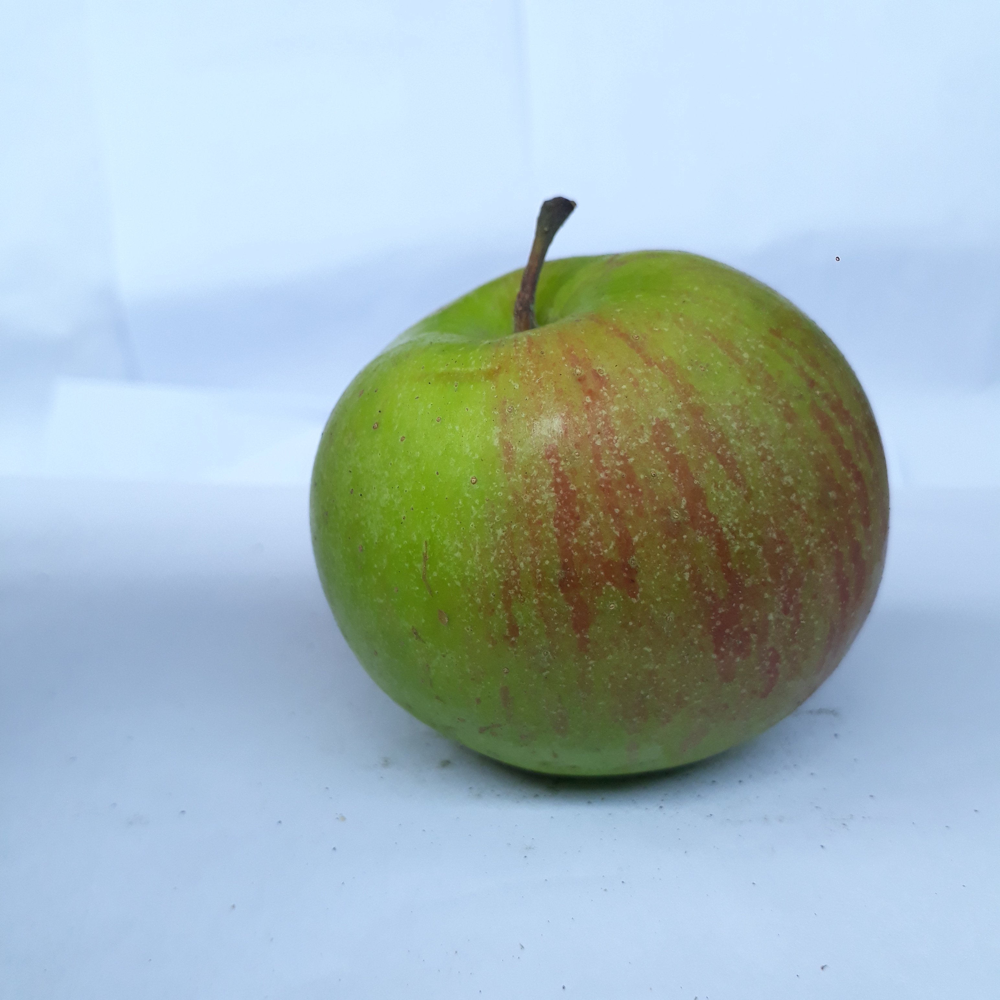

In [14]:
# apple image
apple_image = cv2.imread('input.jpg')
cv2_imshow(apple_image)

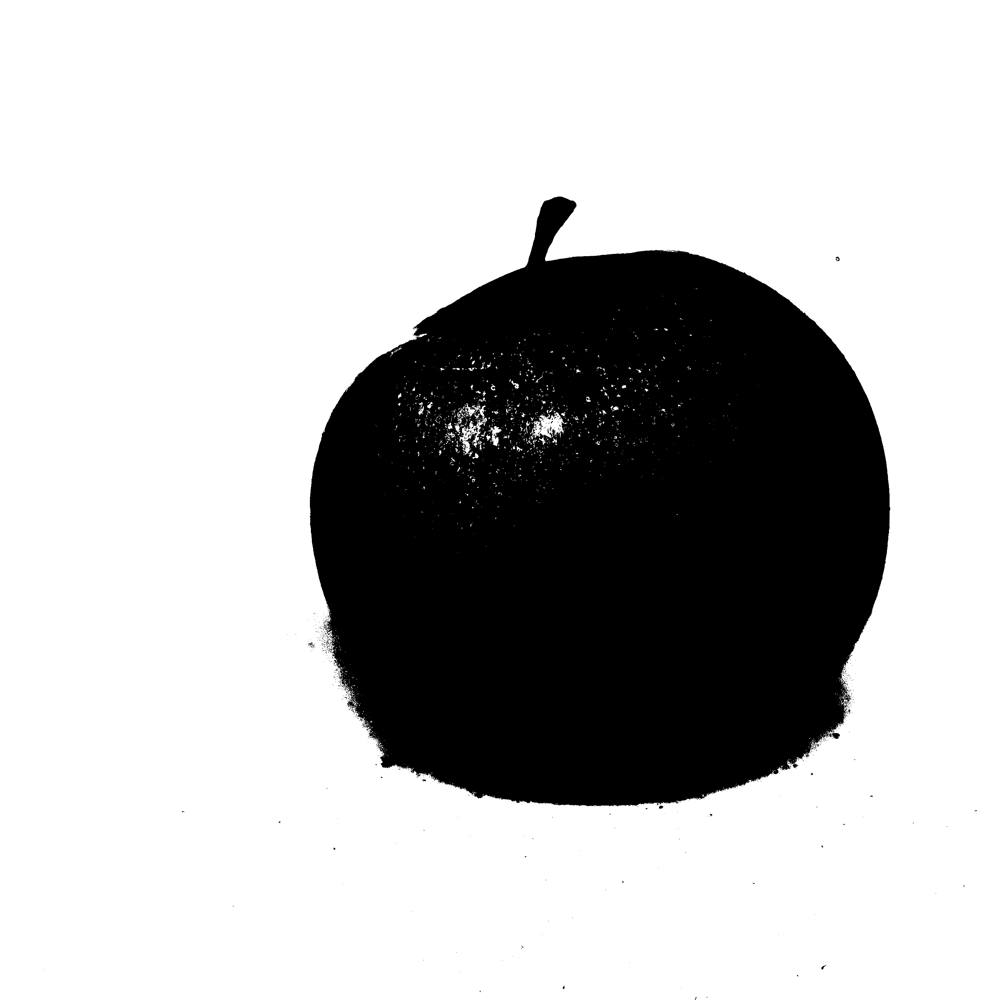

In [2]:
# Import the image in grayscale
img = cv2.imread('input.jpg', cv2.IMREAD_GRAYSCALE)

# Otsu's thresholding
ret, img_otsu_binary = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Plot the images
cv2_imshow(img_otsu_binary)

In [3]:
# assign to new variable
image_bin = img_otsu_binary

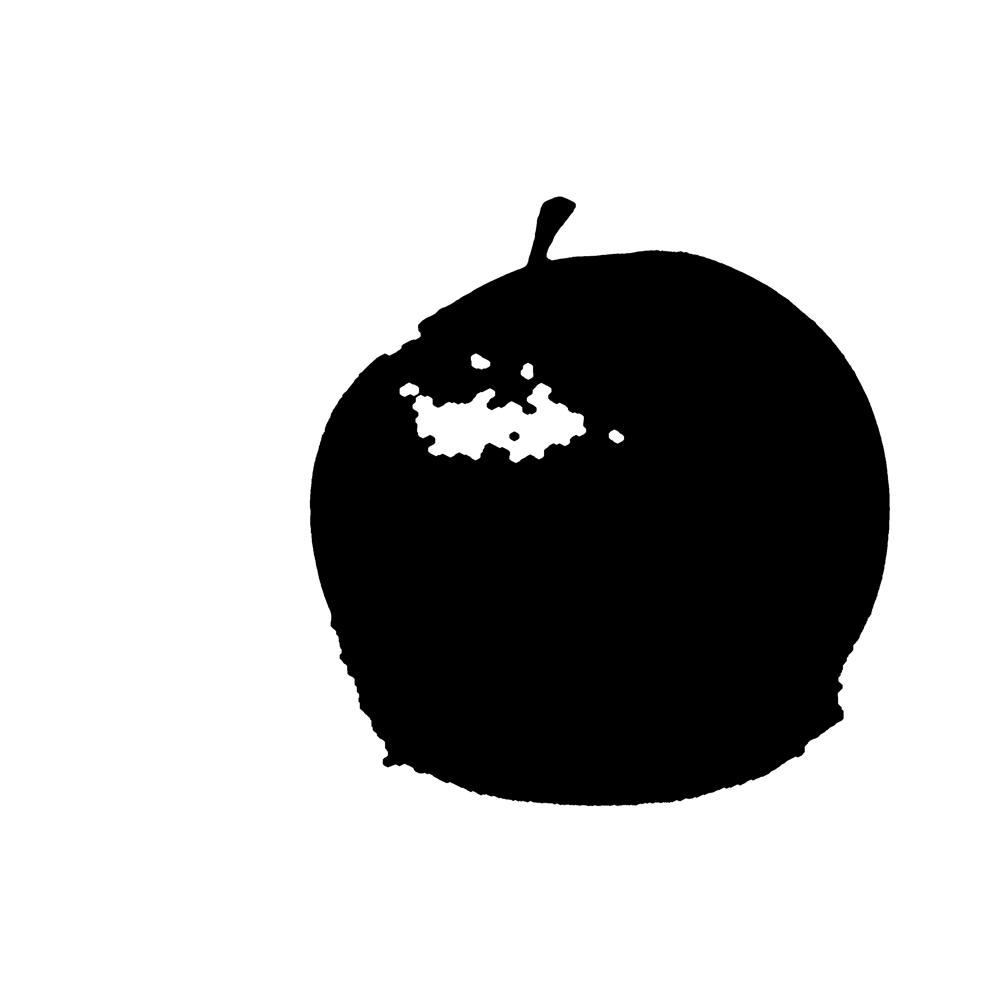

In [4]:
# denoise through morph ops
morph_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
image_bin = cv2.morphologyEx(
    image_bin, cv2.MORPH_CLOSE, morph_kernel, iterations=5)  # remove black dots
image_bin = cv2.morphologyEx(
    image_bin, cv2.MORPH_OPEN, morph_kernel, iterations=5)  # fill inside

# Plot the images
cv2_imshow(image_bin)

In [5]:
# expand bbox
def _expand_bbox(_bbox, _offset_x, _offset_y):
  return (_bbox[0]-_offset_x,
          _bbox[1]-_offset_y,
          _bbox[2]+2*_offset_x,
          _bbox[3]+2*_offset_y)

# add offset
expand_borders_offset=0.005

# get bbox
contours, _ = cv2.findContours(
    image_bin, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
bbox_list = [cv2.boundingRect(c) for c in contours[1:]]

# expand borders
offset_x = int(image_bin.shape[0]*expand_borders_offset)
offset_y = int(image_bin.shape[1]*expand_borders_offset)

bbox_list = [_expand_bbox(c, offset_x, offset_y) for c in bbox_list]
bbox_list

[(941, 591, 1823, 1914),
 (1865, 1311, 77, 74),
 (1259, 1167, 566, 278),
 (1557, 1316, 63, 63),
 (1219, 1166, 90, 75),
 (1593, 1105, 69, 83),
 (1439, 1076, 90, 80)]

In [6]:
# Find the index of the bounding box with the maximum area
max_area_index = max(range(len(bbox_list)), key=lambda i: (bbox_list[i][2] * bbox_list[i][3]))

# Extract the largest bounding box
largest_bbox = bbox_list[max_area_index]

# Create a new list containing only the largest bounding box
bbox_list = [largest_bbox]

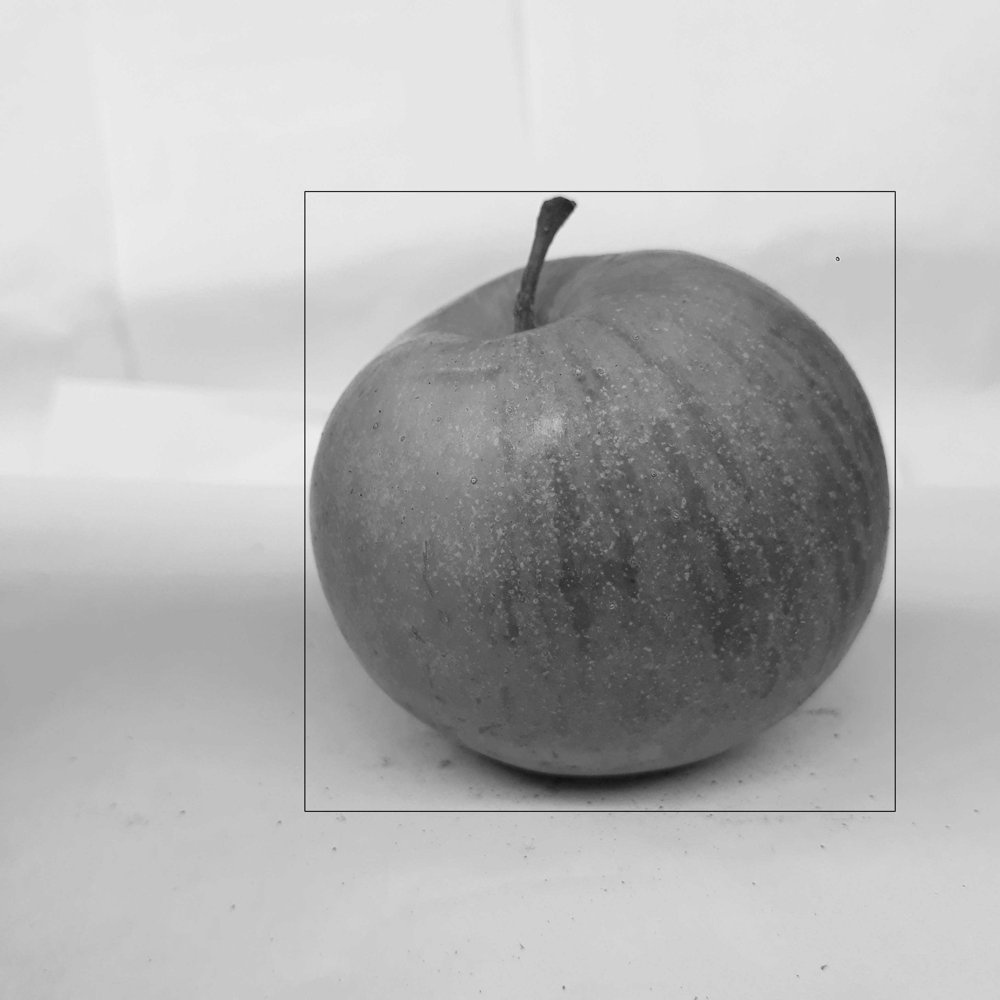

In [7]:
# Draw bounding boxes on the original image
img_with_bbox = img.copy()
for bbox in bbox_list:
    x, y, w, h = bbox
    cv2.rectangle(img_with_bbox, (x, y), (x + w, y + h), (0, 255, 0), 2)  # Green rectangles

# Display the image with bounding boxes
cv2_imshow(img_with_bbox)

In [15]:
def crop_and_process(image, bbox_list):
    obj_list = []
    for bbox in bbox_list:
        x, y, w, h = bbox
        obj_image = image[y:(y + h), x:(x + w)]

        if obj_image.shape[0] * obj_image.shape[1] == 0:
            continue

        if (((obj_image.shape[0] > obj_image.shape[1]) and (obj_image.shape[0] / obj_image.shape[1] > 2))
                or ((obj_image.shape[1] > obj_image.shape[0]) and (obj_image.shape[1] / obj_image.shape[0] > 2))):
            continue

        # pad image to be square
        pad_size = 0
        if obj_image.shape[0] < obj_image.shape[1]:
            pad_size = int((obj_image.shape[1] - obj_image.shape[0]) / 2)
            obj_image = cv2.copyMakeBorder(
                obj_image, pad_size, pad_size, 0, 0, cv2.BORDER_REPLICATE)
        else:
            pad_size = int((obj_image.shape[0] - obj_image.shape[1]) / 2)
            obj_image = cv2.copyMakeBorder(
                obj_image, 0, 0, pad_size, pad_size, cv2.BORDER_REPLICATE)

        obj_list.append(obj_image)

    return obj_list

# Assuming img_with_bbox is the image with the largest bounding box drawn
cropped_objects = crop_and_process(apple_image, bbox_list)

# Now, cropped_objects is a list containing processed images cropped based on the bounding box
cropped_objects

[array([[[255, 235, 210],
         [255, 235, 210],
         [255, 235, 210],
         ...,
         [248, 223, 197],
         [248, 223, 197],
         [248, 223, 197]],
 
        [[255, 236, 211],
         [255, 236, 211],
         [255, 236, 211],
         ...,
         [249, 224, 198],
         [249, 224, 198],
         [249, 224, 198]],
 
        [[255, 234, 209],
         [255, 234, 209],
         [255, 234, 209],
         ...,
         [250, 225, 199],
         [250, 225, 199],
         [250, 225, 199]],
 
        ...,
 
        [[229, 199, 174],
         [229, 199, 174],
         [229, 199, 174],
         ...,
         [228, 197, 174],
         [228, 197, 174],
         [228, 197, 174]],
 
        [[229, 199, 174],
         [229, 199, 174],
         [229, 199, 174],
         ...,
         [228, 197, 174],
         [228, 197, 174],
         [228, 197, 174]],
 
        [[228, 198, 173],
         [228, 198, 173],
         [228, 198, 173],
         ...,
         [231, 200, 177],
  

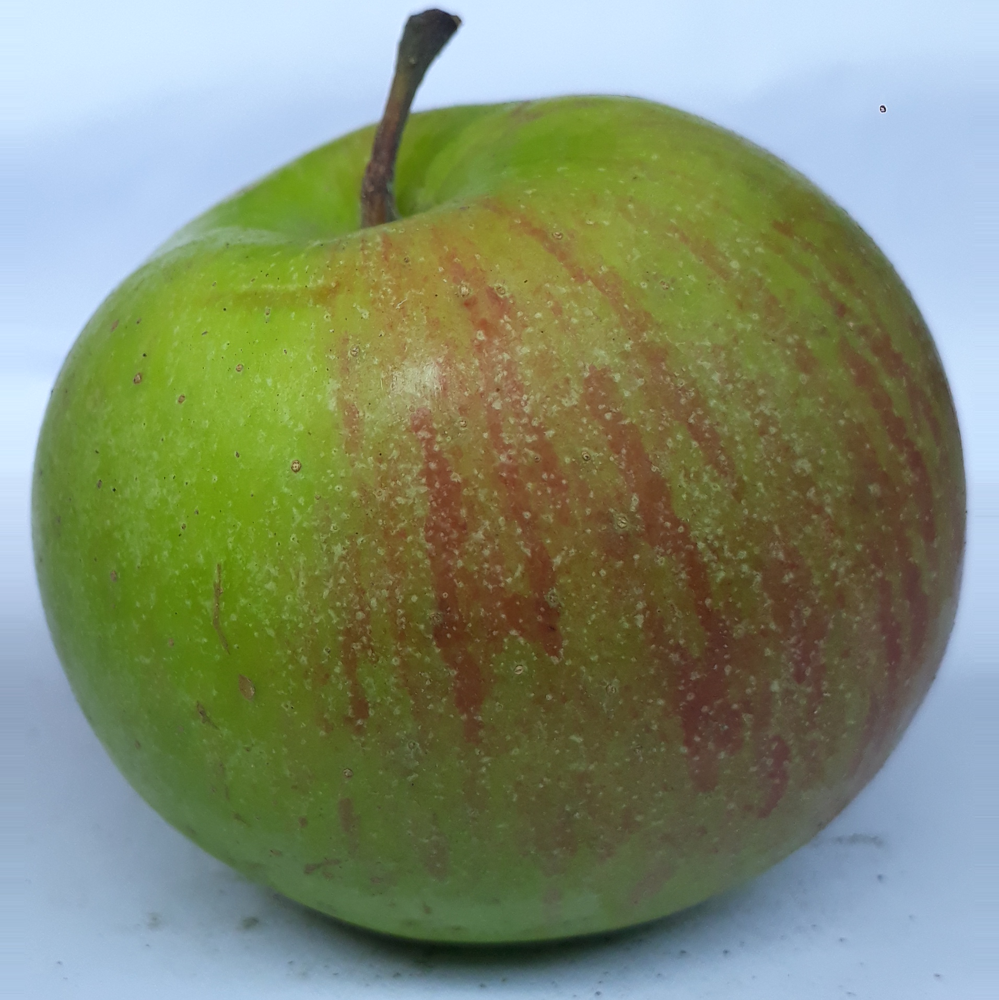

In [16]:
# Display each cropped image separately
for i, cropped_img in enumerate(cropped_objects):
    cv2_imshow(cropped_img)

In [17]:
# Save each color-corrected cropped image
for i, color_cropped_img in enumerate(cropped_objects):
    cv2.imwrite(f'color_cropped_image_{i+1}.png', color_cropped_img)